[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/obss/sahi/blob/main/demo/inference_for_yolov5.ipynb)

## 0. Preperation

- Install latest version of SAHI and YOLOv5:

In [ ]:
#!pip install -U sahi yolov5 scikit-image imagecodecs

In [1]:
import os
os.getcwd()

'/home/yyj-avikus/sahi/demo'

## 1. Export frame

In [2]:
import cv2
import os

def extract_frame(video_path, frame_dir, overwrite=False, start=-1, end=-1, every=1):
    """
    Extract frames from a video using OpenCVs VideoCapture
    :param video_path: path of the video
    :param frames_dir: the directory to save the frames
    :param overwrite: to overwrite frames that already exist?
    :param start: start frame
    :param end: end frame
    :param every: frame spacing
    :return: count of images saved
    """
    
    video_path = os.path.normpath(video_path)
    frame_dir = os.path.normpath(frame_dir)
    
    video_dir, video_filename = os.path.split(video_path)
    video_filename = os.path.splitext(video_filename)[0]
    assert os.path.exists(video_path)
    
    capture = cv2.VideoCapture(video_path)
    
    if start < 0:
        start = 0
    if end < 0:
        end = int(capture.get(cv2.CAP_PROP_FRAME_COUNT))
    
    capture.set(1, start)
    frame = start
    while_safety = 0
    saved_count = 0 
    
    while frame < end:
        _, image = capture.read()
        
        if while_safety > 10:  # break the while if our safety maxs out at 10
            break
            
        if image is None:
            while_safety += 1
            continue
            
        if frame % every == 0:
            while_safety = 0
            
            save_path = os.path.join(frame_dir, video_filename, "{:010d}.jpg".format(frame))
            
            if not os.path.exists(os.path.join(frame_dir, video_filename)):
                os.makedirs(os.path.join(frame_dir, video_filename))
            if not os.path.exists(save_path) or overwrite:
                cv2.imwrite(save_path, image)
                saved_count += 1
                
        frame += 1
        
    capture.release()
        
    return saved_count;

In [ ]:
video_path = "../resources/lidar02.mp4"
frame_dirs = "../resources/export_frame"

extract_frame(video_path, frame_dirs, every=30)

## 3. Import required modules

In [3]:
# arrange an instance segmentation model for test
from sahi.utils.yolov5 import (
    download_yolov5s6_model,
)

# import required functions, classes
from sahi import AutoDetectionModel
from sahi.utils.cv import read_image
from sahi.utils.file import download_from_url
from sahi.predict import get_prediction, get_sliced_prediction, predict
from IPython.display import Image

In [4]:
coco_m_path = '../resources/models/yolov5m.pt'
yolov5_model_path_1 = '../resources/models/model_1.pt'
yolov5_model_path_2 = '../resources/models/model_2.pt'
frozen_model_path = '../resources/models/yolov5_frozen.pt'
opendata_train_model_path = '../resources/models/yolov5_opendata.pt'
customboat_train_model_path = '../resources/models/yolov5_boat_customdata.pt'
exceptbusan_train_model_path = '../resources/models/yolov5_except_busan.pt'

## 4. Standard Inference with a YOLOv5 Model

- Instantiate a detection model by defining model weight path and other parameters:

In [5]:
detection_model_1 = AutoDetectionModel.from_pretrained(
    model_type='yolov5',
    model_path=yolov5_model_path_1,
    confidence_threshold=0.25,
    device="cuda:0"
)

detection_model_2 = AutoDetectionModel.from_pretrained(
    model_type='yolov5',
    model_path=yolov5_model_path_2,
    confidence_threshold=0.25,
    device="cuda:0"
)

frozen_model = AutoDetectionModel.from_pretrained(
    model_type='yolov5',
    model_path=frozen_model_path,
    confidence_threshold=0.25,
    device="cuda:0"
)

coco_base_model = AutoDetectionModel.from_pretrained(
    model_type='yolov5',
    model_path=coco_m_path,
    confidence_threshold=0.25,
    device="cuda:0"
)

# for only 10 epoch, train open-dataset
opendata_model = AutoDetectionModel.from_pretrained(
    model_type='yolov5',
    model_path=opendata_train_model_path,
    confidence_threshold=0.25,
    device="cuda:0"
)

# for 200 epoch, train custom-dataset(wangsan, busan ..., FL)
customboat_model = AutoDetectionModel.from_pretrained(
    model_type='yolov5',
    model_path=customboat_train_model_path,
    confidence_threshold=0.25,
    device="cuda:0"
)

# for 10 epoch from opendata_model, train custom-dataset(Except BUSAN)
exceptbusan_model = AutoDetectionModel.from_pretrained(
    model_type='yolov5',
    model_path=exceptbusan_train_model_path,
    confidence_threshold=0.25,
    device="cuda:0"
)

- Perform prediction by feeding the get_prediction function with an image path and a DetectionModel instance:

In [6]:
test_image_path = "../resources/export_frame/lidar01/0000018960.jpg"

In [7]:
result = get_prediction(test_image_path, detection_model_1)

- Or perform prediction by feeding the get_prediction function with a numpy image and a DetectionModel instance:

In [8]:
# result = get_prediction(read_image(test_image_path), detection_model)

- Visualize predicted bounding boxes and masks over the original image:

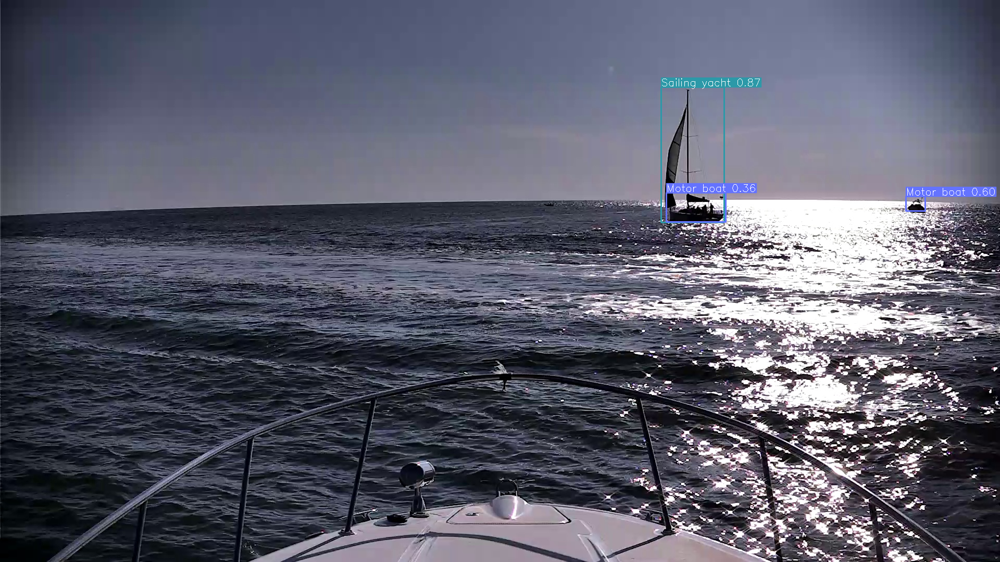

In [9]:
result = get_prediction(read_image(test_image_path), detection_model_1)
result.export_visuals(export_dir="demo_data/", file_name="prediction_visual1")

Image("demo_data/prediction_visual1.png")

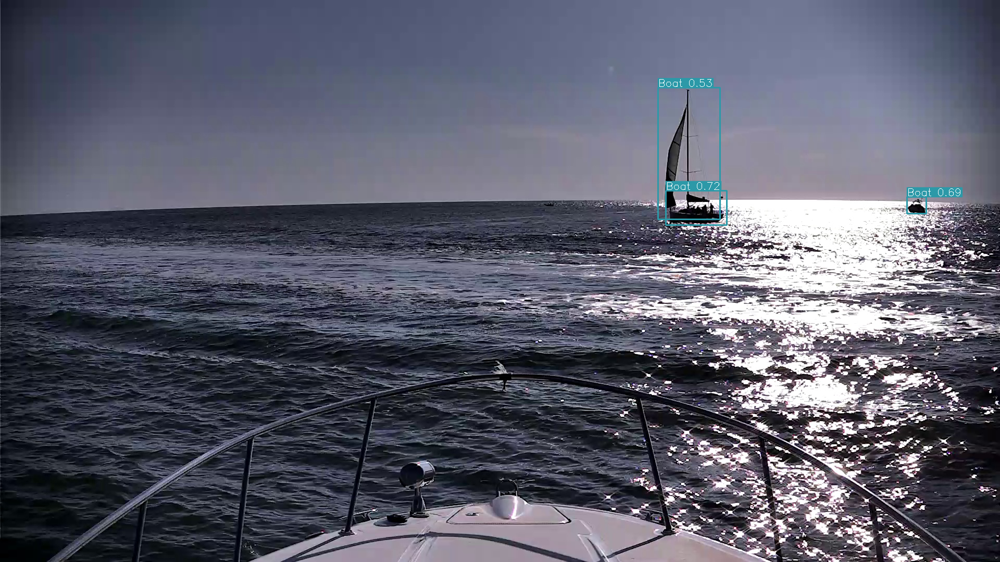

In [10]:
result = get_prediction(test_image_path, detection_model_2)
result.export_visuals(export_dir="demo_data/", file_name="prediction_visual2")

Image("demo_data/prediction_visual2.png")

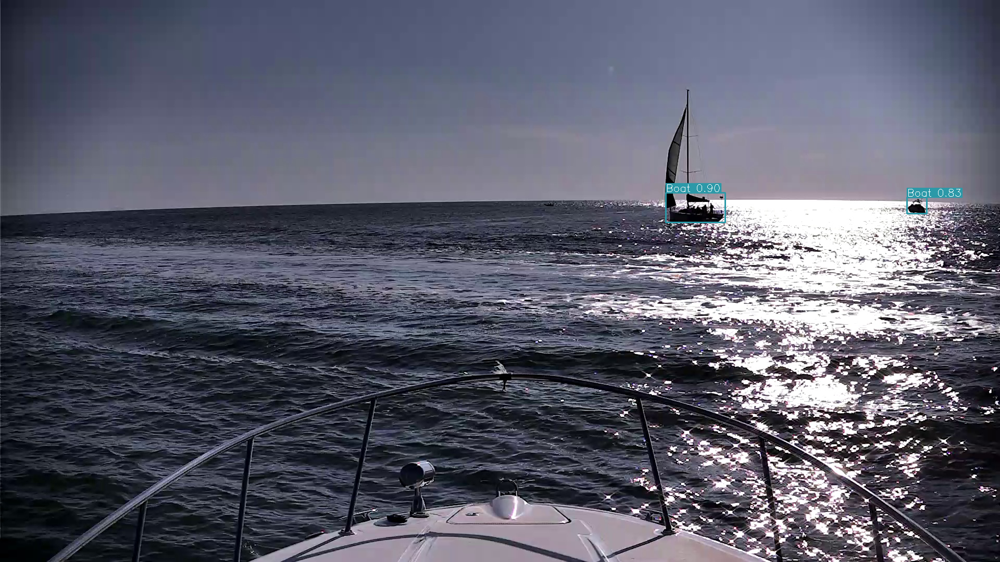

In [11]:
result = get_prediction(test_image_path, frozen_model)
result.export_visuals(export_dir="demo_data/", file_name="prediction_visual3")

Image("demo_data/prediction_visual3.png")

## 4-1. Total Image

In [12]:
model_type = "yolov5"
model_path = frozen_model_path
model_device = "cuda:0" # or 'cpu'
model_confidence_threshold = 0.4

slice_height = 256
slice_width = 256
overlap_height_ratio = 0.2
overlap_width_ratio = 0.2

source_image_dir = "../resources/export_frame/lidar01/"

no_sliced_prediction = True
no_standard_prediction = False

In [ ]:
predict(
    model_type=model_type,
    model_path=model_path,
    model_device=model_device,
    model_confidence_threshold=model_confidence_threshold,
    no_sliced_prediction=no_sliced_prediction,
    no_standard_prediction=no_standard_prediction,
    source=source_image_dir,
    slice_height=slice_height,
    slice_width=slice_width,
    overlap_height_ratio=overlap_height_ratio,
    overlap_width_ratio=overlap_width_ratio,
)

## 4-2. Interact show_samples

In [13]:
source_image_dir = "../resources/export_frame/lidar01/"
image_files = sorted([fn for fn in os.listdir(source_image_dir) if fn.endswith("jpg")])

In [14]:
len(image_files)

655

In [15]:
from sahi.utils.cv import Colors
import numpy as np
import copy

def visualize_object_predictions(
    image: np.array,
    object_prediction_list,
    rect_th: int = None,
    text_size: float = None,
    text_th: float = None,
    color: tuple = None,
):
    """
    Visualizes prediction category names, bounding boxes over the source image
    and exports it to output folder.
    Arguments:
        object_prediction_list: a list of prediction.ObjectPrediction
        rect_th: rectangle thickness
        text_size: size of the category name over box
        text_th: text thickness
        color: annotation color in the form: (0, 255, 0)
        output_dir: directory for resulting visualization to be exported
        file_name: exported file will be saved as: output_dir+file_name+".png"
        export_format: can be specified as 'jpg' or 'png'
    """
    # deepcopy image so that original is not altered
    image = copy.deepcopy(image)
    # select predefined classwise color palette if not specified
    if color is None:
        colors = Colors()
    else:
        colors = None
    # set rect_th for boxes
    rect_th = rect_th or max(round(sum(image.shape) / 2 * 0.001), 1)
    # set text_th for category names
    text_th = text_th or max(rect_th - 1, 1)
    # set text_size for category names
    text_size = text_size or rect_th / 3
    # add bbox and mask to image if present
    for object_prediction in object_prediction_list:
        # deepcopy object_prediction_list so that original is not altered
        object_prediction = object_prediction.deepcopy()

        bbox = object_prediction.bbox.to_voc_bbox()
        category_name = object_prediction.category.name
        score = object_prediction.score.value

        # set color
        if colors is not None:
            color = colors(object_prediction.category.id)
        # visualize masks if present
        if object_prediction.mask is not None:
            # deepcopy mask so that original is not altered
            mask = object_prediction.mask.bool_mask
            # draw mask
            rgb_mask = apply_color_mask(mask, color)
            image = cv2.addWeighted(image, 1, rgb_mask, 0.4, 0)
        # set bbox points
        p1, p2 = (int(bbox[0]), int(bbox[1])), (int(bbox[2]), int(bbox[3]))
        # visualize boxes
        cv2.rectangle(
            image,
            p1,
            p2,
            color=color,
            thickness=rect_th
        )
        # arange bounding box text location
        label = f"{category_name} {score:.2f}"
        w, h = cv2.getTextSize(label, 0, fontScale=text_size, thickness=text_th)[0]  # label width, height
        outside = p1[1] - h - 3 >= 0  # label fits outside box
        p2 = p1[0] + w, p1[1] - h - 3 if outside else p1[1] + h + 3
        # add bounding box text
        cv2.rectangle(image, p1, p2, color, -1, cv2.LINE_AA)  # filled
        cv2.putText(
            image,
            label,
            (p1[0], p1[1] - 2 if outside else p1[1] + h + 2),
            0,
            text_size,
            (255, 255, 255),
            thickness=text_th,
        )
        
    
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
    return image

In [17]:
from ipywidgets import interact
import matplotlib.pyplot as plt
%matplotlib inline

@interact(index=(0, len(image_files)-1))
def show_sample(index=0):
    image_file = image_files[index]
    image_path = os.path.join(source_image_dir, image_file)
    image = cv2.imread(image_path)
    
    result = get_prediction(image_path, coco_base_model)
    
    canvas = visualize_object_predictions(image, result.object_prediction_list)
    
    plt.figure(figsize=(16,16))
    plt.imshow(canvas)
    plt.axis('off')
    plt.show()

interactive(children=(IntSlider(value=0, description='index', max=654), Output()), _dom_classes=('widget-inter…

In [18]:
from ipywidgets import interact
import matplotlib.pyplot as plt
%matplotlib inline

@interact(index=(0, len(image_files)-1), confidence_score=(0, 1, 0.05))
def show_sample(index=0, confidence_score=0.25):
    model = AutoDetectionModel.from_pretrained(
        model_type='yolov5',
        model_path=coco_m_path,
        confidence_threshold=confidence_score,
        device="cuda:0"
    )

    image_file = image_files[index]
    image_path = os.path.join(source_image_dir, image_file)
    image = cv2.imread(image_path)
    
    result = get_prediction(image_path, model)
    
    canvas = visualize_object_predictions(image, result.object_prediction_list)
    
    plt.figure(figsize=(16,16))
    plt.imshow(canvas)
    plt.axis('off')
    plt.show()
    

interactive(children=(IntSlider(value=0, description='index', max=654), FloatSlider(value=0.25, description='c…

## 4-3. Interact show_samples with no nms AutoShape 

In [19]:
from yolov5.models.common import AutoShape, DetectMultiBackend
from yolov5.utils.torch_utils import select_device

device="cuda:0"
autoshape=True
model_path=customboat_train_model_path

device = select_device(device)
model = DetectMultiBackend(model_path, device=device, fuse=autoshape)  # detection model
model = AutoShape(model)  # for file/URI/PIL/cv2/np inputs and NMS

10/06/2022 08:37:00 - INFO - yolov5 -   YOLOv5 🚀 2022-10-4 Python-3.8.13 torch-1.8.2 CUDA:0 (NVIDIA GeForce GTX 1660 SUPER, 5936MiB)

YOLOv5 🚀 2022-10-4 Python-3.8.13 torch-1.8.2 CUDA:0 (NVIDIA GeForce GTX 1660 SUPER, 5936MiB)

10/06/2022 08:37:00 - INFO - yolov5 -   Fusing layers... 
Fusing layers... 
10/06/2022 08:37:00 - INFO - yolov5 -   Model summary: 291 layers, 20883441 parameters, 0 gradients, 48.3 GFLOPs
Model summary: 291 layers, 20883441 parameters, 0 gradients, 48.3 GFLOPs
10/06/2022 08:37:00 - INFO - yolov5 -   Adding AutoShape... 
Adding AutoShape... 


In [20]:
from ipywidgets import interact
import matplotlib.pyplot as plt
%matplotlib inline

@interact(index=(0, len(image_files)-1))
def show_sample(index=0):
    image_file = image_files[index]
    image_path = os.path.join(source_image_dir, image_file)
    
    result = model(image_path, nms=False)
    canvas = result.render()[0]
    
    plt.figure(figsize=(16,16))
    plt.imshow(canvas)
    plt.axis('off')
    plt.show()

interactive(children=(IntSlider(value=0, description='index', max=654), Output()), _dom_classes=('widget-inter…

In [21]:
from ipywidgets import interact
import matplotlib.pyplot as plt
%matplotlib inline

@interact(index=(0, len(image_files)-1))
def show_sample(index=0):
    image_file = image_files[index]
    image_path = os.path.join(source_image_dir, image_file)
    image = cv2.imread(image_path)
    
    print("Image Path:", image_path)
    result_with_nms = get_prediction(image_path, opendata_model)

    canvas1 = visualize_object_predictions(image, result_with_nms.object_prediction_list)
    
    result_with_no_nms = model(image_path, nms=False)
    
    canvas2 = result_with_no_nms.render()[0]
    
    fig, axes = plt.subplots(1, 2, figsize=(32,32)) 
    plt.subplots_adjust(wspace=0.05, hspace=0.05)
    
    axes[0].axis('off')
    axes[1].axis('off')
    
    axes[0].imshow(canvas1)
    axes[1].imshow(canvas2)
    
    plt.axis('off')
    plt.show()

interactive(children=(IntSlider(value=0, description='index', max=654), Output()), _dom_classes=('widget-inter…

## 4-4. Interact show_samples with slice prediction

In [23]:
from typing import List
import copy
import matplotlib.pyplot as plt
import cv2
%matplotlib inline 
from sahi import slicing
from sahi.slicing import slice_image

slicing.logger.setLevel(slicing.logging.INFO)

# single_row_y_start: int = 200,
@interact(index=(0, len(image_files)-1), slice_size=(0, 512), overlap_ratio=(0, 0.5, 0.05), single_row_y_start=(0, 512))
def visualize_slice_rect(index=0, slice_size=256, overlap_ratio=0.2, single_row_y_start=200):
    
    image_file = image_files[index]
    image_path = os.path.join(source_image_dir, image_file)
    
    res = slice_image(image_path, 
                      slice_width=slice_size,
                      slice_height=slice_size,
                      overlap_height_ratio=overlap_ratio,
                      overlap_width_ratio=overlap_ratio,
                      single_row_y_start=single_row_y_start,
                      single_row_predict=True,
                      verbose=1)

    image = cv2.imread(image_path)
    image = copy.deepcopy(image)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    for start_pixel in res.starting_pixels:
        cv2.rectangle(image,
                      start_pixel,
                      [s1+s2 for s1, s2 in zip(start_pixel,[slice_size,slice_size])],
                      color=(255, 0, 0),
                      thickness=2)

    plt.figure(figsize=(16,16))
    plt.imshow(image)
    plt.axis('off')
    plt.show()

interactive(children=(IntSlider(value=0, description='index', max=654), IntSlider(value=256, description='slic…

In [28]:
from ipywidgets import interact
import matplotlib.pyplot as plt
%matplotlib inline

overlap_ratio=0.2
slice_size=512

@interact(index=(0, len(image_files)-1))
def show_sample(index=0):
    image_file = image_files[index]
    image_path = os.path.join(source_image_dir, image_file)
    image = cv2.imread(image_path)
    
    slice_result = slice_image(image_path, 
                              slice_width=slice_size,
                              slice_height=slice_size,
                              overlap_height_ratio=overlap_ratio,
                              overlap_width_ratio=overlap_ratio,
                              single_row_y_start=200,
                              single_row_predict=True,
                              verbose=1)

    for start_pixel in slice_result.starting_pixels:
        cv2.rectangle(image,
                      start_pixel,
                      [s1+s2 for s1, s2 in zip(start_pixel,[slice_size,slice_size])],
                      color=(255, 255, 0),
                      thickness=2)
        
    result = get_sliced_prediction(image_path,
                                   exceptbusan_model,
                                   slice_height=slice_size,
                                   slice_width=slice_size,
                                   postprocess_match_threshold=0.5,
                                   overlap_height_ratio=overlap_ratio,
                                   overlap_width_ratio=overlap_ratio,
                                   single_row_y_start=200,
                                   single_row_predict=True)
    
    canvas = visualize_object_predictions(image, result.object_prediction_list)
    
    plt.figure(figsize=(16,16))
    plt.imshow(canvas)
    plt.axis('off')
    plt.show()

interactive(children=(IntSlider(value=0, description='index', max=654), Output()), _dom_classes=('widget-inter…

## Show Yolo Input Image

In [29]:
# Pre-process
from pathlib import Path
from PIL import Image
from yolov5.utils.dataloaders import exif_transpose, letterbox
from yolov5.utils.general import make_divisible
import torch

ims = "../resources/export_frame/lidar01/0000018960.jpg"
size = (640, 640)
device = "cuda:0"

n, ims = (1, [ims])  # number, list of images

shape1 = [] # image and inference shapes, filenames
for i, im in enumerate(ims):
    f = f'image{i}'  # filename
    if isinstance(im, (str, Path)):  # filename or uri
        im, f = Image.open(requests.get(im, stream=True).raw if str(im).startswith('http') else im), im
        im = np.asarray(exif_transpose(im))
    elif isinstance(im, Image.Image):  # PIL Image
        im, f = np.asarray(exif_transpose(im)), getattr(im, 'filename', f) or f
    if im.shape[0] < 5:  # image in CHW
        im = im.transpose((1, 2, 0))  # reverse dataloader .transpose(2, 0, 1)
    im = im[..., :3] if im.ndim == 3 else cv2.cvtColor(im, cv2.COLOR_GRAY2BGR)  # enforce 3ch input
    
    s = im.shape[:2]  # HWC
    g = max(size) / max(s)  # gain
    shape1.append([y * g for y in s])
    ims[i] = im if im.data.contiguous else np.ascontiguousarray(im)  # update

shape1 = [make_divisible(x, 32) for x in np.array(shape1).max(0)] # inf shape
x = [letterbox(im, shape1, auto=False)[0] for im in ims]  # pad
x = np.ascontiguousarray(np.array(x).transpose((0, 3, 1, 2)))  # stack and BHWC to BCHW
x = torch.from_numpy(x).to(torch.device(device)).type(torch.float32) / 255  # uint8 to fp16/32

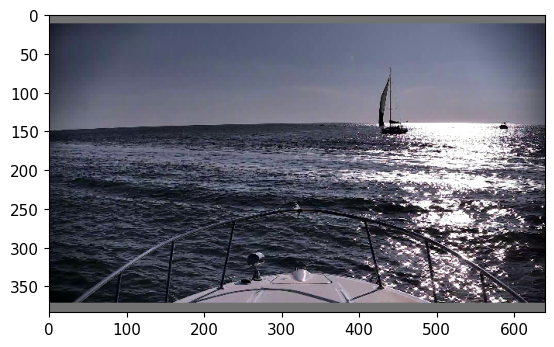

In [30]:
plt.imshow(x[0].permute(1,2,0).cpu())

## 5. SAHI Benchmark

### 5-1. Create Val.json

In [ ]:
def initial_extract(img_dir, label_dir, out_dir):
    licenses = [
        {
            "name": "",
            "id": 0,
            "url": ""
        }
    ]

    info_ = [
        {
            "contributor": "",
            "date_created": "",
            "description": "",
            "url": "",
            "version": "",
            "year": ""
        }
    ]

    categories = [
        {
            "id": 1,
            "name": "Buoy",
            "supercategory": ""
        },
        {
            "id": 2,
            "name": "Sailing yacht",
            "supercategory": ""
        },
        {
            "id": 3,
            "name": "Boat",
            "supercategory": ""
        },
        {
            "id": 4,
            "name": "Structure",
            "supercategory": ""
        },
        {
            "id": 5,
            "name": "Other",
            "supercategory": ""
        },
        {
            "id": 6,
            "name": "Channel Marker",
            "supercategory": ""
        },
        {
            "id": 7,
            "name": "Speed Warning Sign",
            "supercategory": ""
        },
        {
            "id": 8,
            "name": "Extra boat",
            "supercategory": ""
        }
    ]

    img_idx = 0
    annot_idx = 0

    imgs_list = []
    annots_list = []

    for label_file in os.listdir(label_dir):
        label_file_ = os.path.join(label_dir, label_file)
        img_file_ = os.path.join(img_dir, f'{label_file.split(".")[0]}.jpg')
        img = Image.open(img_file_)
        image_w, image_h = img.size

        imgs_list.append({
            'id': img_idx,
            'width': image_w,
            'height': image_h,
            'file_name': f'{label_file.split(".")[0]}.jpg',
            "license": 0,
            "flickr_url": "",
            "coco_url": "",
            "date_captured": 0
        })

        with open(label_file_, 'r') as label_f:
            labels = label_f.readlines()

            for label in labels:
                cat, xc, yc, label_normalized_w, label_normalized_h = list(map(lambda x: int(x) if len(x) == 1 else float(x), label.split()))
                label_w, label_h = image_w * label_normalized_w, image_h * label_normalized_h
                xmin, ymin = (image_w * xc) - (label_w / 2), (image_h * yc) - (label_h / 2)
                
                xmin = 0 if xmin < 0 else xmin
                ymin = 0 if ymin < 0 else ymin

                annots_list.append({
                    'id': annot_idx,
                    'image_id': img_idx,
                    'category_id': cat + 1,
                    'area': int(label_h * label_w),
                    'bbox': [
                        xmin,
                        ymin,
                        label_w,
                        label_h
                    ],
                    'iscrowd': 0,
                    'attributes': {
                        'type': '',
                        'occluded': False
                    }
                })

                annot_idx += 1

        img_idx += 1

    out_dict = {
        'licenses': licenses,
        'info': info_,
        'categories': categories,
        'images': imgs_list,
        'annotations': annots_list
    }

    with open(os.path.join(out_dir, 'val.json'), 'w') as out_f:
        print(os.path.join(out_dir, 'val.json'))
        json.dump(out_dict, out_f)

In [ ]:
initial_extract(img_dir, label_dir, out_dir)

### 5-2. Predict: Parameter Sweep 

In [ ]:
from pathlib import Path

from sahi.predict import predict
from sahi.scripts.coco_error_analysis import analyse
from sahi.scripts.coco_evaluation import evaluate

MODEL_TYPE = "yolov5"
MODEL_PATH = ""
MODEL_CONFIG_PATH = ""
EVAL_IMAGES_FOLDER_DIR = ""
EVAL_DATASET_JSON_PATH = ""
INFERENCE_SETTING = "AVIKUS_FL"
EXPORT_VISUAL = False
MAX_DETECTIONS = 500

In [ ]:
INFERENCE_SETTING_TO_PARAMS = {
    "AVIKUS_FL": {
        "no_standard_prediction": False,
        "no_sliced_prediction": False,
        "slice_size": 640,
        "overlap_ratio": 0.25,
        "match_threshold": 0.5,
        "postprocess_class_agnostic": False,
        "single_row_y_start": 0,
    },
}

setting_params = INFERENCE_SETTING_TO_PARAMS[INFERENCE_SETTING]

In [ ]:
result = predict(
    model_type=MODEL_TYPE,
    model_path=MODEL_PATH,
    model_config_path=MODEL_CONFIG_PATH,
    model_confidence_threshold=0.01,
    model_device="cuda:0",
    model_category_mapping=None,
    model_category_remapping=None,
    source=EVAL_IMAGES_FOLDER_DIR,
    no_standard_prediction=setting_params["no_standard_prediction"],
    no_sliced_prediction=setting_params["no_sliced_prediction"],
    image_size=None,
    slice_height=setting_params["slice_size"],
    slice_width=setting_params["slice_size"],
    overlap_height_ratio=setting_params["overlap_ratio"],
    overlap_width_ratio=setting_params["overlap_ratio"],
    postprocess_type="GREEDYNMM",
    postprocess_match_metric="IOS",
    postprocess_match_threshold=setting_params["match_threshold"],
    postprocess_class_agnostic=setting_params["postprocess_class_agnostic"],
    novisual=not EXPORT_VISUAL,
    dataset_json_path=EVAL_DATASET_JSON_PATH,
    project="runs/predict_eval_analyse",
    name=INFERENCE_SETTING,
    visual_bbox_thickness=None,
    visual_text_size=None,
    visual_text_thickness=None,
    visual_export_format="png",
    verbose=1,
    return_dict=True,
    force_postprocess_type=True,
    single_row_predict=True,
    single_row_y_start=setting_params["single_row_y_start"]
)

result_json_path = str(Path(result["export_dir"]) / "result.json")

evaluate(
    dataset_json_path=EVAL_DATASET_JSON_PATH,
    result_json_path=result_json_path,
    classwise=True,
    max_detections=MAX_DETECTIONS,
    return_dict=False,
)

analyse(
    dataset_json_path=EVAL_DATASET_JSON_PATH,
    result_json_path=result_json_path,
    max_detections=MAX_DETECTIONS,
    return_dict=False,
)

In [ ]:
### slice_size
for p_slice in [256, 384, 512, 640]:
    INFERENCE_SETTING_TO_PARAMS[INFERENCE_SETTING]["slice_size"] = p_slice
    ### overlap_ratio
    for p_overlap_ratio in [0, 0.1, 0.2, 0.25]:
        INFERENCE_SETTING_TO_PARAMS[INFERENCE_SETTING]["overlap_ratio"] = p_overlap_ratio
        ### match_threshold
        for p_match_threshold in [0.5, 0.7, 0.9]:
            INFERENCE_SETTING_TO_PARAMS[INFERENCE_SETTING]["match_threshold"] = p_match_threshold
            ### postprocess_class_agnostic
            for p_postprocess_class_agnostic in [True, False]:
                INFERENCE_SETTING_TO_PARAMS[INFERENCE_SETTING]["postprocess_class_agnostic"] = p_postprocess_class_agnostic
                ### no_sliced_prediction
                for p_no_sliced_prediction in [True, False]:
                    INFERENCE_SETTING_TO_PARAMS[INFERENCE_SETTING]["no_sliced_prediction"] = p_no_sliced_prediction
                    ### single_row_y_start
                    for p_single_row_y_start in [0, 100, 200]:
                        INFERENCE_SETTING_TO_PARAMS[INFERENCE_SETTING]["single_row_y_start"] = p_single_row_y_start
                    
                        result = predict(
                            model_type=MODEL_TYPE,
                            model_path=MODEL_PATH,
                            model_config_path=MODEL_CONFIG_PATH,
                            model_confidence_threshold=0.01,
                            model_device="cuda:0",
                            model_category_mapping=None,
                            model_category_remapping=None,
                            source=EVAL_IMAGES_FOLDER_DIR,
                            no_standard_prediction=setting_params["no_standard_prediction"],
                            no_sliced_prediction=setting_params["no_sliced_prediction"],
                            image_size=None,
                            slice_height=setting_params["slice_size"],
                            slice_width=setting_params["slice_size"],
                            overlap_height_ratio=setting_params["overlap_ratio"],
                            overlap_width_ratio=setting_params["overlap_ratio"],
                            postprocess_type="GREEDYNMM",
                            postprocess_match_metric="IOS",
                            postprocess_match_threshold=setting_params["match_threshold"],
                            postprocess_class_agnostic=setting_params["postprocess_class_agnostic"],
                            novisual=not EXPORT_VISUAL,
                            dataset_json_path=EVAL_DATASET_JSON_PATH,
                            project="runs/predict_eval_analyse",
                            name=INFERENCE_SETTING,
                            visual_bbox_thickness=None,
                            visual_text_size=None,
                            visual_text_thickness=None,
                            visual_export_format="png",
                            verbose=1,
                            return_dict=True,
                            force_postprocess_type=True,
                            single_row_predict=True,
                            single_row_y_start=setting_params["single_row_y_start"]
                        )
                        
                    ### model_confidence_threshold
                    

## 5. Sliced Inference with a YOLOv5 Model

- To perform sliced prediction we need to specify slice parameters. In this example we will perform prediction over slices of 256x256 with an overlap ratio of 0.2:

In [ ]:
test_image_path = "../resources/export_frame/lidar01/0000018960.jpg"

- Visualize predicted bounding boxes and masks over the original image:

In [ ]:
result = get_sliced_prediction(
    test_image_path,
    detection_model_1,
    slice_height = 416,
    slice_width = 416,
    overlap_height_ratio = 0.2,
    overlap_width_ratio = 0.2
)

result.export_visuals(export_dir="demo_data/", file_name="slice_prediction_visual1")

Image("demo_data/slice_prediction_visual1.png")

In [ ]:
result = get_sliced_prediction(
    test_image_path,
    detection_model_2,
    slice_height = 416,
    slice_width = 416,
    overlap_height_ratio = 0.2,
    overlap_width_ratio = 0.2
)

result.export_visuals(export_dir="demo_data/", file_name="slice_prediction_visual2")

Image("demo_data/slice_prediction_visual2.png")

In [ ]:
result = get_sliced_prediction(
    test_image_path,
    frozen_model,
    slice_height = 416,
    slice_width = 416,
    overlap_height_ratio = 0.2,
    overlap_width_ratio = 0.2,
    
)

result.export_visuals(export_dir="demo_data/", file_name="slice_prediction_visual3")

Image("demo_data/slice_prediction_visual3.png")

## 3. Prediction Result

- Predictions are returned as [sahi.prediction.PredictionResult](sahi/prediction.py), you can access the object prediction list as:

In [ ]:
object_prediction_list = result.object_prediction_list

In [ ]:
object_prediction_list[0]

- ObjectPrediction's can be converted to [COCO annotation](https://cocodataset.org/#format-data) format:

In [ ]:
result.to_coco_annotations()[:3]

- ObjectPrediction's can be converted to [COCO prediction](https://github.com/i008/COCO-dataset-explorer) format:

In [ ]:
result.to_coco_predictions(image_id=1)[:3]

- ObjectPrediction's can be converted to [imantics](https://github.com/jsbroks/imantics) annotation format:

In [ ]:
result.to_imantics_annotations()[:3]

- ObjectPrediction's can be converted to [fiftyone](https://github.com/voxel51/fiftyone) detection format:

In [ ]:
result.to_fiftyone_detections()[:3]